In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

In [50]:
# df = pd.read_csv('data/final_combined_dataset.csv')

# geocode_list = [3300100,3303807]
# df = df[df['geocode'].isin(geocode_list)]
# # df = df.drop(columns=['geocode'])

# df['week'] = pd.to_numeric(df['week'], errors='coerce')
# df['date'] = pd.to_datetime(df['date'])
# # Add date_ordinal
# df['date_ordinal'] = df['date'].apply(lambda x: x.toordinal())

# # Extract year and month
# df['year'] = df['date'].dt.year
# df['month'] = df['date'].dt.month

# # Add cyclic month representation
# df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
# df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

# # Add cyclic week representation
# df['week_sin'] = np.sin(2 * np.pi * df['week'] / 52)
# df['week_cos'] = np.cos(2 * np.pi * df['week'] / 52)

# # Step 2: Create lag features
# def create_lags(dataframe, group_col, target_col, lags, inplace = False):
#     if isinstance(target_col, list):  # If target_col is a list of columns
#         for col in target_col:
#             for lag in lags:
#                 if inplace:
#                     dataframe[target_col] = dataframe.groupby(group_col)[col].shift(lag)
#                 else:
#                     dataframe[f'{col}_lag{lag}'] = dataframe.groupby(group_col)[col].shift(lag)
#     else:  # If target_col is a single column
#         for lag in lags:
#             if inplace:
#                 dataframe[target_col] = dataframe.groupby(group_col)[target_col].shift(lag)
#             else:
#                 dataframe[f'{target_col}_lag{lag}'] = dataframe.groupby(group_col)[target_col].shift(lag)
#     return dataframe

# # Lag cases by 1 and 2 weeks
# data = create_lags(df, group_col='city', target_col='cases', lags=[1, 2,3,4])

# # Lag weather-related variables by 5 and 6 weeks for each city
# weather_columns = ['tempe_min', 'temp_avg', 'temp_max', 'humidity_max', 'humidity_avg', 'humidity_min',
#                    'precipitation_avg_ordinary_kriging', 'precipitation_max_ordinary_kriging',
#                    'precipitation_avg_regression_kriging', 'precipitation_max_regression_kriging']
# data = create_lags(df, group_col='city', target_col=weather_columns, lags=[4, 5, 6])

# data = data.dropna().reset_index(drop=True)

# data = pd.get_dummies(data, columns=['geocode'], prefix='geocode',dtype=int)

# train_data = data[data['date'].dt.year <= 2020]
# test_data = data[data['date'].dt.year >= 2021]

# print("Training set shape:", train_data.shape)
# print("Test set shape:", test_data.shape)

# X_train = train_data.drop(columns=['cases','cases_per_100k'])
# y_train = train_data[['cases']]

# X_test = test_data.drop(columns=['cases','cases_per_100k'])
# y_test = test_data[['cases']]

# data = data.drop(columns=['date','cases_per_100k'])

# # Exclude columns_to_scale and the target variable from scaling
# columns_to_scale = ['week_sin', 'week_cos', 'month_sin', 'month_cos', 'week','lat','long','geocode']
# numeric_cols = [
#     col for col in data.select_dtypes(include=['float64', 'int64', 'int32']).columns 
#     if col not in ['cases'] + columns_to_scale
# ]

# # Initialize scalers
# feature_scaler = MinMaxScaler()
# target_scaler = MinMaxScaler()

# # Scale the selected numeric features
# X_train[numeric_cols] = feature_scaler.fit_transform(X_train[numeric_cols])
# X_test[numeric_cols] = feature_scaler.transform(X_test[numeric_cols])

# # Scale the target variable
# y_train = target_scaler.fit_transform(y_train)
# y_test = target_scaler.transform(y_test)

# feature_cols = [
#     # 'temp_avg_lag4', 'humidity_avg_lag4', 
#     'cases_lag1', 'cases_lag2','cases_lag3','cases_lag4',
#     # 'precipitation_max_regression_kriging_lag4'
#     # , 'week_sin', 'month_sin', 
#     # 'week_cos', 'month_cos',
# ]

# # Select one-hot encoded columns (geocode columns start with 'geocode_')
# one_hot_cols = [col for col in X_train.columns if col.startswith('geocode_')]

# # Combine selected features and one-hot encoded columns
# selected_columns = feature_cols + one_hot_cols

# # Filter the dataset to keep only these columns
# X_train = X_train[selected_columns]
# X_test = X_test[selected_columns]

In [51]:
from sklearn.preprocessing import LabelEncoder

df = pd.read_csv('data/final_combined_dataset.csv')

# geocode_list = [3303807]
# df = df[df['geocode'].isin(geocode_list)]
# df = df.drop(columns=['geocode'])

df['week'] = pd.to_numeric(df['week'], errors='coerce')
df['date'] = pd.to_datetime(df['date'])
# Add date_ordinal
df['date_ordinal'] = df['date'].apply(lambda x: x.toordinal())

# Extract year and month
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month

# Add cyclic month representation
df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

# Add cyclic week representation
df['week_sin'] = np.sin(2 * np.pi * df['week'] / 52)
df['week_cos'] = np.cos(2 * np.pi * df['week'] / 52)

# Step 2: Create lag features
def create_lags(dataframe, group_col, target_col, lags, inplace = False):
    if isinstance(target_col, list):  # If target_col is a list of columns
        for col in target_col:
            for lag in lags:
                if inplace:
                    dataframe[target_col] = dataframe.groupby(group_col)[col].shift(lag)
                else:
                    dataframe[f'{col}_lag{lag}'] = dataframe.groupby(group_col)[col].shift(lag)
    else:  # If target_col is a single column
        for lag in lags:
            if inplace:
                dataframe[target_col] = dataframe.groupby(group_col)[target_col].shift(lag)
            else:
                dataframe[f'{target_col}_lag{lag}'] = dataframe.groupby(group_col)[target_col].shift(lag)
    return dataframe

# Lag cases by 1 and 2 weeks
data = create_lags(df, group_col='city', target_col='cases', lags=[1, 2,3,4])

# Lag weather-related variables by 5 and 6 weeks for each city
weather_columns = ['tempe_min', 'temp_avg', 'temp_max', 'humidity_max', 'humidity_avg', 'humidity_min',
                   'precipitation_avg_ordinary_kriging', 'precipitation_max_ordinary_kriging',
                   'precipitation_avg_regression_kriging', 'precipitation_max_regression_kriging']
data = create_lags(df, group_col='city', target_col=weather_columns, lags=[4, 5, 6])
data = data.dropna().reset_index(drop=True)


# Initialize the Label Encoder
label_encoder = LabelEncoder()

# Fit and transform the 'geocode' column
data['geocode'] = label_encoder.fit_transform(data['geocode'])

train_data = data[data['date'].dt.year <= 2020]
test_data = data[data['date'].dt.year >= 2021]

print("Training set shape:", train_data.shape)
print("Test set shape:", test_data.shape)

X_train = train_data.drop(columns=['cases','cases_per_100k'])
y_train = train_data[['cases']]

X_test = test_data.drop(columns=['cases','cases_per_100k'])
y_test = test_data[['cases']]

data = data.drop(columns=['date','cases_per_100k'])

# Exclude columns_to_scale and the target variable from scaling
columns_to_scale = ['week_sin', 'week_cos', 'month_sin', 'month_cos', 'week','lat','long','geocode']
numeric_cols = [
    col for col in data.select_dtypes(include=['float64', 'int64', 'int32']).columns 
    if col not in ['cases'] + columns_to_scale
]

# Initialize scalers
feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

# Scale the selected numeric features
X_train[numeric_cols] = feature_scaler.fit_transform(X_train[numeric_cols])
X_test[numeric_cols] = feature_scaler.transform(X_test[numeric_cols])

# Scale the target variable
y_train = target_scaler.fit_transform(y_train)
y_test = target_scaler.transform(y_test)

feature_cols = [
    'temp_avg_lag4', 'humidity_avg_lag4', 
    'cases_lag1', 'cases_lag2','cases_lag3','cases_lag4',
    'precipitation_max_regression_kriging_lag4'
    # , 'week_sin', 'month_sin', 
    # 'week_cos', 'month_cos',
]



# Combine selected features and one-hot encoded columns
selected_columns = feature_cols + ['geocode']

# Filter the dataset to keep only these columns
X_train = X_train[selected_columns]
X_test = X_test[selected_columns]

Training set shape: (42224, 63)
Test set shape: (9464, 63)


In [52]:
X_train.head(1000)

,temp_avg_lag4,humidity_avg_lag4,cases_lag1,cases_lag2,cases_lag3,cases_lag4,precipitation_max_regression_kriging_lag4,geocode
0,0.676283,0.164814,0.002652,0.002448,0.002244,0.001292,0.050450,0
1,0.696355,0.134769,0.002516,0.002652,0.002448,0.002244,0.084866,0
2,0.744210,0.076346,0.002244,0.002516,0.002652,0.002448,0.126653,0
3,0.857288,0.030776,0.003128,0.002244,0.002516,0.002652,0.418930,0
4,0.735651,0.112676,0.002856,0.003128,0.002244,0.002516,0.466587,0
...,...,...,...,...,...,...,...,...
1203,0.782568,0.242814,0.003535,0.004283,0.005235,0.009111,0.004257,2
1204,0.705855,0.161814,0.000884,0.003535,0.004283,0.005235,0.041855,2
1205,0.752428,0.261805,0.001088,0.000884,0.003535,0.004283,0.113926,2
1206,0.685779,0.246962,0.000136,0.001088,0.000884,0.003535,0.057664,2


In [53]:

# # Function to create overlapping sequences
# seq_length=4
# def create_sequences(data, target, seq_length):
#     X, y = [], []
#     for i in range(len(data) - seq_length):
#         X.append(data[i:i + seq_length].values)  # Select seq_length rows as input
#         y.append(target[i + seq_length])  # Select the next row as the target
#     return np.array(X), np.array(y)


# def create_sequences_geocode_wise(data, target, seq_length, geocode_columns):
#     X, y = [], []
    
#     # Iterate over each geocode group
#     for geocode in geocode_columns:
#         # Get the data for this geocode group
#         geocode_data = data[data[geocode] == 1]  # Select rows where geocode is 1 (one-hot encoding)
#         geocode_target = target[data[geocode] == 1]  # Corresponding target values
        
#         # Create sequences for this geocode
#         X_geo, y_geo = create_sequences(geocode_data, geocode_target, seq_length)
        
#         # Append to the lists
#         X.append(X_geo)
#         y.append(y_geo)
    
#     # Concatenate all geocode-wise sequences
#     X = np.concatenate(X, axis=0)
#     y = np.concatenate(y, axis=0)
#     return X, y

# # Extract the one-
# # hot encoded geocode columns (geocode columns start with 'geocode_')
# geocode_columns = [col for col in X_train.columns if col.startswith('geocode_')]

# # Create sequences for training (geocode-wise)
# X_train, y_train = create_sequences_geocode_wise(X_train, y_train, seq_length, geocode_columns)

# # Create sequences for testing (geocode-wise)
# X_test, y_test = create_sequences_geocode_wise(X_test, y_test, seq_length, geocode_columns)

# # Print the shapes to verify
# print("X_train shape:", X_train.shape)  # (samples, timesteps, features)
# print("y_train shape:", y_train.shape)  # (samples,)
# print("X_test shape:", X_test.shape)    # (samples, timesteps, features)
# print("y_test shape:", y_test.shape)    # (samples,)


In [54]:
seq_length = 4

def create_sequences(data, target, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length].values)  # Select seq_length rows as input
        y.append(target[i + seq_length])  # Select the next row as the target
    return np.array(X), np.array(y)


def create_sequences_geocode_wise(data, target, seq_length):
    X, y = [], []

    # Group by geocode
    for geocode in data['geocode'].unique():
        geocode_data = data[data['geocode'] == geocode]  # Filter rows for this geocode
        geocode_target = target[data['geocode'] == geocode]  # Corresponding target values

        # Create sequences for this geocode
        X_geo, y_geo = create_sequences(geocode_data, geocode_target, seq_length)

        # Append to the lists
        X.append(X_geo)
        y.append(y_geo)

    # Concatenate all geocode-wise sequences
    X = np.concatenate(X, axis=0)
    y = np.concatenate(y, axis=0)
    return X, y


# Create sequences for training (geocode-wise)
X_train, y_train = create_sequences_geocode_wise(X_train, y_train, seq_length)

# Create sequences for testing (geocode-wise)
X_test, y_test = create_sequences_geocode_wise(X_test, y_test, seq_length)

# Print the shapes to verify
print("X_train shape:", X_train.shape)  # (samples, timesteps, features)
print("y_train shape:", y_train.shape)  # (samples,)
print("X_test shape:", X_test.shape)    # (samples, timesteps, features)
print("y_test shape:", y_test.shape)    # (samples,)

# Encode geocode as integers
df['geocode'] = df['geocode'].astype('category').cat.codes  
num_geocodes = df['geocode'].nunique()  # Get number of unique geocodes
from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate, Embedding, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

# Separate geocode after sequence creation
X_train_lstm = X_train[:, :, :-1]  # Exclude last column (geocode)
X_train_geocode = X_train[:, 0, -1].astype(int)  # Extract geocode as separate categorical input

X_test_lstm = X_test[:, :, :-1]
X_test_geocode = X_test[:, 0, -1].astype(int)

# Print shapes for verification
print("X_train_lstm shape:", X_train_lstm.shape)  # (samples, timesteps, features)
print("X_train_geocode shape:", X_train_geocode.shape)  # (samples,)
print("y_train shape:", y_train.shape)

# Define LSTM model with geocode embeddings
seq_length = X_train_lstm.shape[1]  
num_features = X_train_lstm.shape[2]  
from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate, Embedding, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# LSTM Branch
lstm_input = Input(shape=(seq_length, num_features), name="lstm_input")
lstm_layer = LSTM(64, return_sequences=True)(lstm_input)  # First LSTM layer
lstm_layer = LSTM(32, return_sequences=False)(lstm_layer)  # Second LSTM layer
lstm_layer = Dense(32, activation="relu")(lstm_layer)  # Fully connected layer after LSTM
lstm_layer = Dropout(0.2)(lstm_layer)  # Dropout for regularization

# Geocode Embedding Branch
geocode_input = Input(shape=(1,), name="geocode_input")
geocode_embedding = Embedding(input_dim=num_geocodes + 1, output_dim=10)(geocode_input)  # Embedding layer
geocode_embedding = Flatten()(geocode_embedding)  # Convert to 1D
# geocode_embedding = Dense(16, activation="relu")(geocode_embedding)  # Dense layer for embedding
# geocode_embedding = Dense(8, activation="relu")(geocode_embedding)

# Merge both branches
merged = Concatenate()([lstm_layer, geocode_embedding])  # Merge LSTM and geocode features
merged = Dense(32, activation="relu")(merged)  # Fully connected layer after merging
merged = Dense(16, activation="relu")(merged)
output = Dense(1, activation="linear")(merged)  # Final output for regression

# Define and Compile Model
model = Model(inputs=[lstm_input, geocode_input], outputs=output)
model.compile(optimizer=Adam(learning_rate=0.001), loss='mae', metrics=['mae'])

# Train the model
history = model.fit(
    [X_train_lstm, X_train_geocode],
    y_train,
    validation_data=([X_test_lstm, X_test_geocode], y_test),
    epochs=50,
    batch_size=32
)

# Evaluate
test_loss, test_mae = model.evaluate([X_test_lstm, X_test_geocode], y_test)
print(f"Test MAE: {test_mae:.4f}")

X_train shape: (41860, 4, 8)
y_train shape: (41860, 1)
X_test shape: (9100, 4, 8)
y_test shape: (9100, 1)
X_train_lstm shape: (41860, 4, 7)
X_train_geocode shape: (41860,)
y_train shape: (41860, 1)
Epoch 1/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 25s 9ms/step - loss: 0.0016 - mae: 0.0016 - val_loss: 5.3356e-04 - val_mae: 5.3356e-04
Epoch 2/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0011 - mae: 0.0011 - val_loss: 2.9082e-04 - val_mae: 2.9082e-04
Epoch 3/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0011 - mae: 0.0011 - val_loss: 2.4749e-04 - val_mae: 2.4749e-04
Epoch 4/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 9.7579e-04 - mae: 9.7579e-04 - val_loss: 2.3381e-04 - val_mae: 2.3381e-04
Epoch 5/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 15s 11ms/step - loss: 9.0251e-04 - mae: 9.0251e-04 - val_loss: 3.6700e-04 - val_mae: 3.6700e-04
Epoch 6/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 25s 19ms/step - loss: 8.0876e-04 - mae: 8.0876e-04 - val_loss: 4.7169e-04 - val_mae: 4.7169e-04
Epoc

285/285 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step


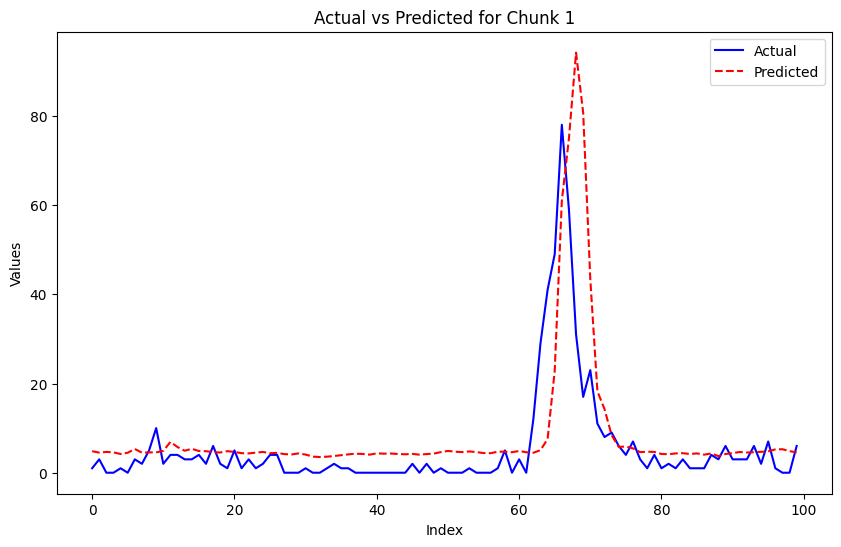

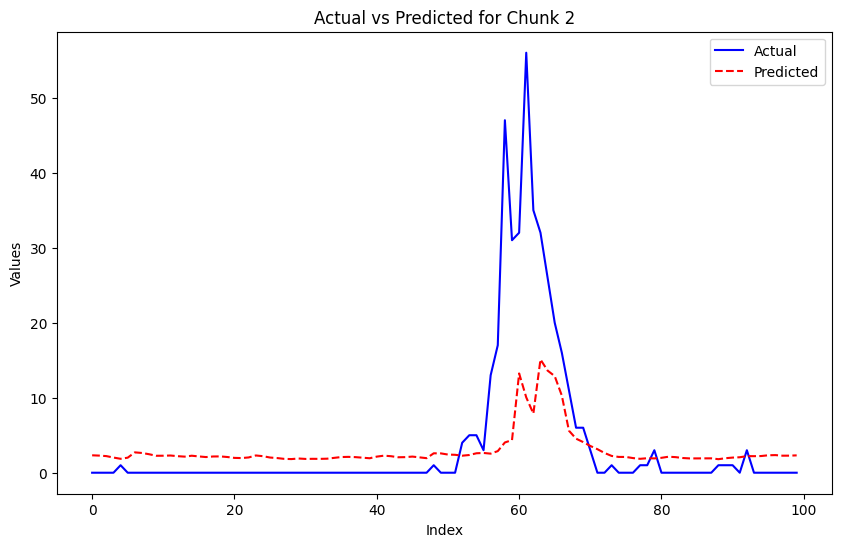

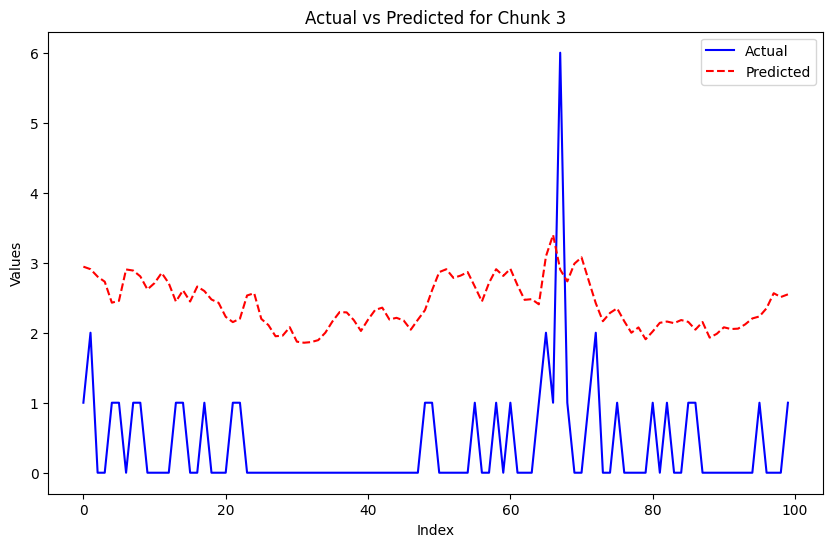

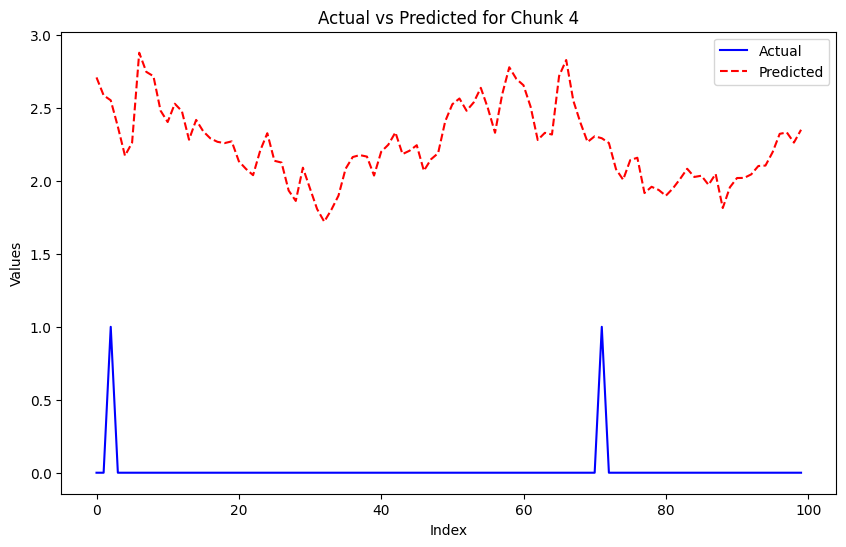

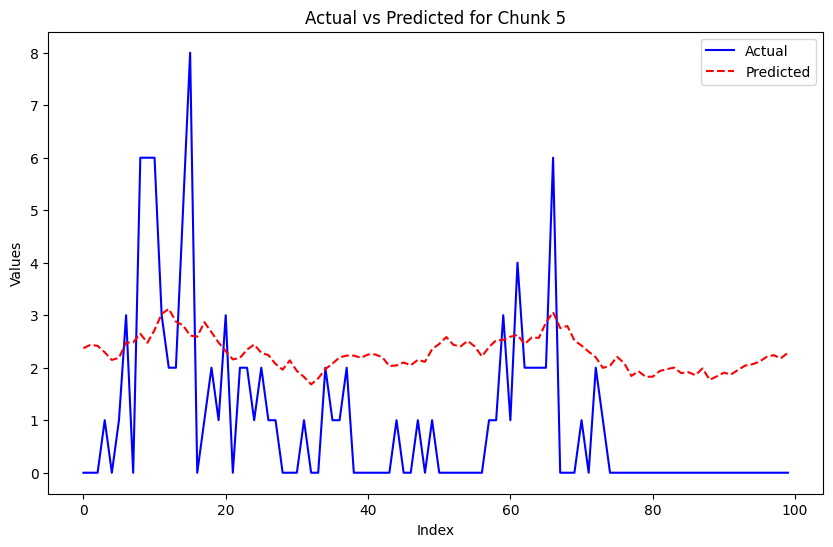

...

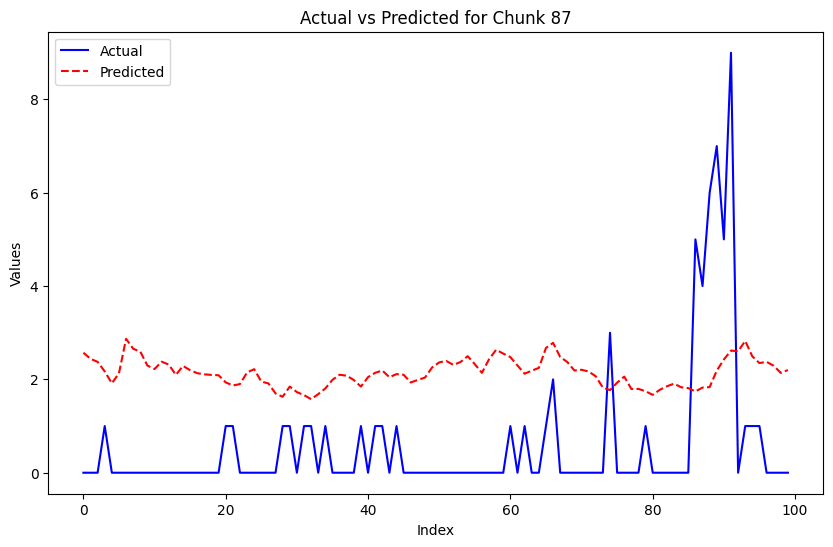

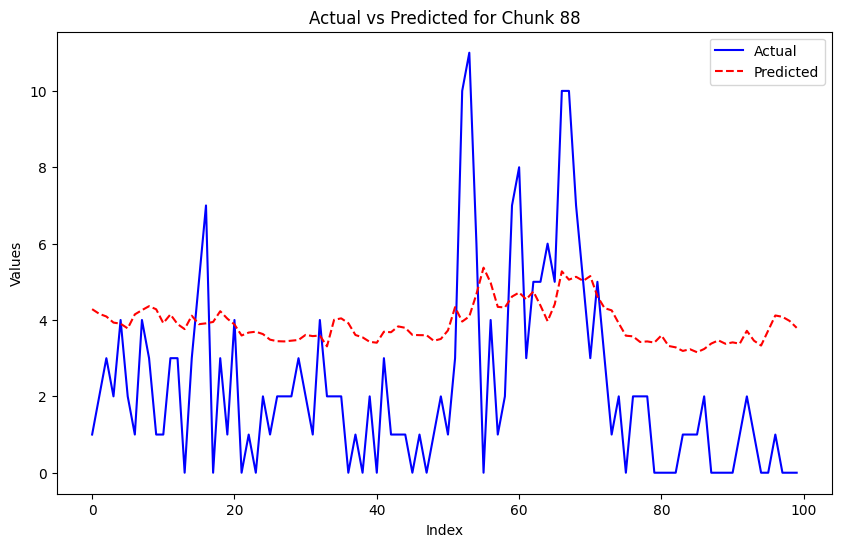

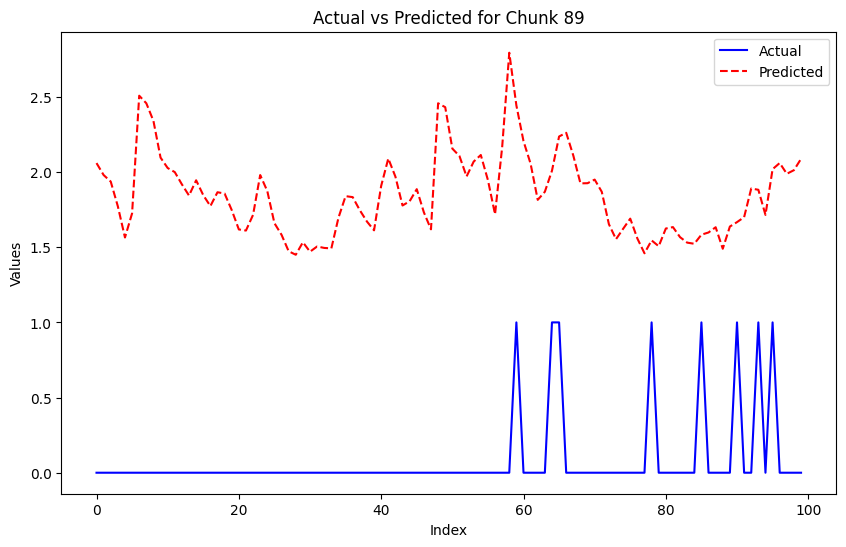

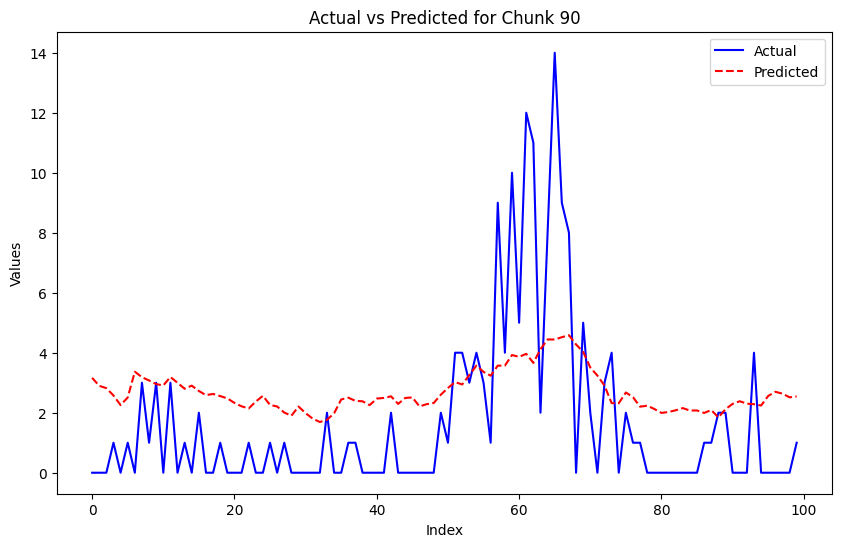

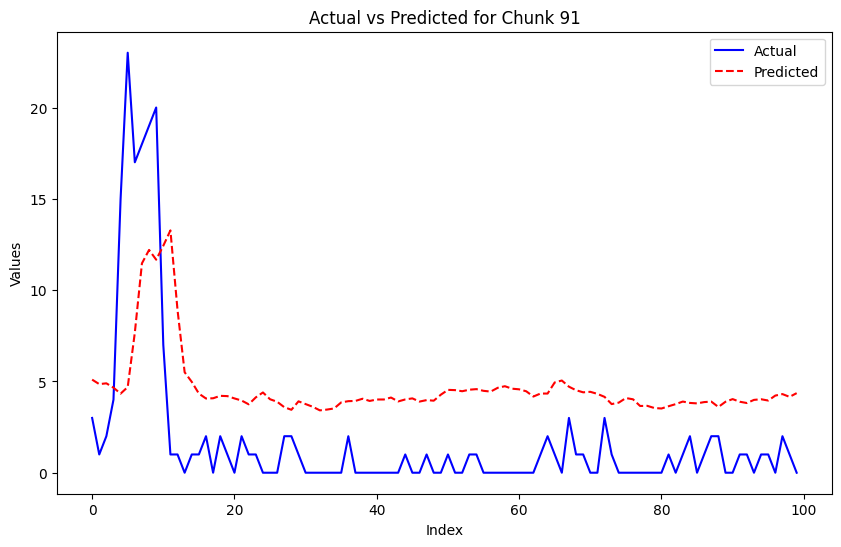

In [55]:
# Make predictions on the test data
predictions = model.predict([X_test_lstm, X_test_geocode])

# Rescale actual values back to the original scale
y_test_rescaled = target_scaler.inverse_transform(y_test.reshape(-1, 1))

# Rescale the predicted values back to the original scale
test_predictions_rescaled = target_scaler.inverse_transform(predictions)

import matplotlib.pyplot as plt

# Number of cases per plot (as you specified: 100)
chunk_size = 100
num_chunks = len(test_predictions_rescaled) // chunk_size

# Loop through each chunk and plot the actual vs predicted values
for i in range(num_chunks):
    # Get the start and end indices for the current chunk
    start_idx = i * chunk_size
    end_idx = (i + 1) * chunk_size
    
    # Get the actual and predicted values for the current chunk
    actual_chunk = y_test_rescaled[start_idx:end_idx]
    predicted_chunk = test_predictions_rescaled[start_idx:end_idx]
    
    # Plot the actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(actual_chunk, label='Actual', color='blue')
    plt.plot(predicted_chunk, label='Predicted', color='red', linestyle='--')
    plt.title(f'Actual vs Predicted for Chunk {i+1}')
    plt.xlabel('Index')
    plt.ylabel('Values')
    plt.legend()
    plt.show()


In [20]:
seq_length = 4

def create_sequences(data, target, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length].values)  # Select seq_length rows as input
        y.append(target[i + seq_length])  # Select the next row as the target
    return np.array(X), np.array(y)


def create_sequences_geocode_wise(data, target, seq_length):
    X, y = [], []

    # Group by geocode
    for geocode in data['geocode'].unique():
        geocode_data = data[data['geocode'] == geocode]  # Filter rows for this geocode
        geocode_target = target[data['geocode'] == geocode]  # Corresponding target values

        # Create sequences for this geocode
        X_geo, y_geo = create_sequences(geocode_data, geocode_target, seq_length)

        # Append to the lists
        X.append(X_geo)
        y.append(y_geo)

    # Concatenate all geocode-wise sequences
    X = np.concatenate(X, axis=0)
    y = np.concatenate(y, axis=0)
    return X, y


# Create sequences for training (geocode-wise)
X_train, y_train = create_sequences_geocode_wise(X_train, y_train, seq_length)

# Create sequences for testing (geocode-wise)
X_test, y_test = create_sequences_geocode_wise(X_test, y_test, seq_length)

# Print the shapes to verify
print("X_train shape:", X_train.shape)  # (samples, timesteps, features)
print("y_train shape:", y_train.shape)  # (samples,)
print("X_test shape:", X_test.shape)    # (samples, timesteps, features)
print("y_test shape:", y_test.shape)    # (samples,)

# Encode geocode as integers
df['geocode'] = df['geocode'].astype('category').cat.codes  
num_geocodes = df['geocode'].nunique()  # Get number of unique geocodes
from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate, Embedding, Flatten,Model
from tensorflow.keras.optimizers import Adam

# Separate geocode after sequence creation
X_train_lstm = X_train[:, :, :-1]  # Exclude last column (geocode)
X_train_geocode = X_train[:, 0, -1].astype(int)  # Extract geocode as separate categorical input

X_test_lstm = X_test[:, :, :-1]
X_test_geocode = X_test[:, 0, -1].astype(int)

# Print shapes for verification
print("X_train_lstm shape:", X_train_lstm.shape)  # (samples, timesteps, features)
print("X_train_geocode shape:", X_train_geocode.shape)  # (samples,)
print("y_train shape:", y_train.shape)

# Define LSTM model with geocode embeddings
seq_length = X_train_lstm.shape[1]  
num_features = X_train_lstm.shape[2]  

# LSTM Input
lstm_input = Input(shape=(seq_length, num_features), name="lstm_input")
lstm_layer = LSTM(64, return_sequences=False)(lstm_input)

# Geocode Embedding
geocode_input = Input(shape=(1,), name="geocode_input")
geocode_embedding = Embedding(input_dim=num_geocodes + 1, output_dim=10)(geocode_input)  
geocode_embedding = Flatten()(geocode_embedding)  

# Concatenate LSTM output and geocode embedding
merged = Concatenate()([lstm_layer, geocode_embedding])
output = Dense(1, activation='linear')(merged)

# Build and compile model
model = Model(inputs=[lstm_input, geocode_input], outputs=output)
model.compile(optimizer=Adam(learning_rate=0.001), loss='mae', metrics=['mae'])

# Train the model
history = model.fit(
    [X_train_lstm, X_train_geocode],  
    y_train,
    validation_data=([X_test_lstm, X_test_geocode], y_test),
    epochs=50,
    batch_size=32
)

# Evaluate the model
test_loss, test_mae = model.evaluate([X_test_lstm, X_test_geocode], y_test)
print(f"Test MAE: {test_mae:.4f}")

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

285/285 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


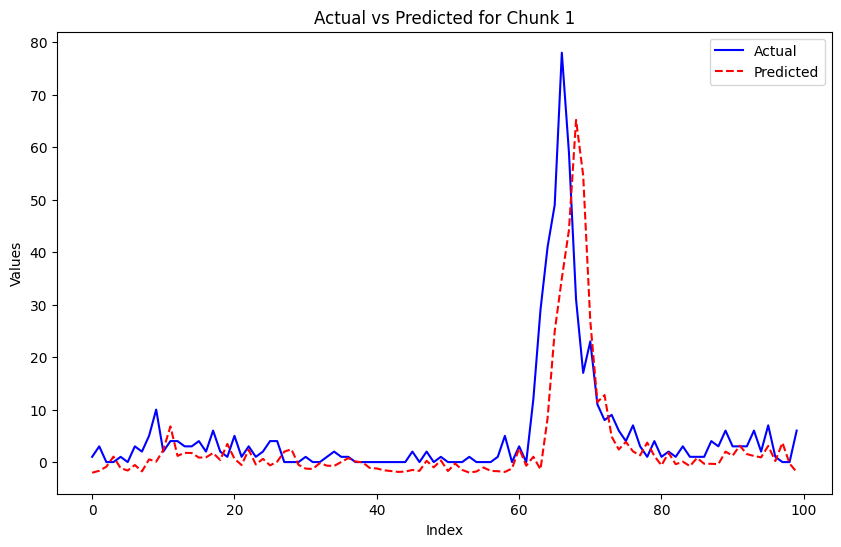

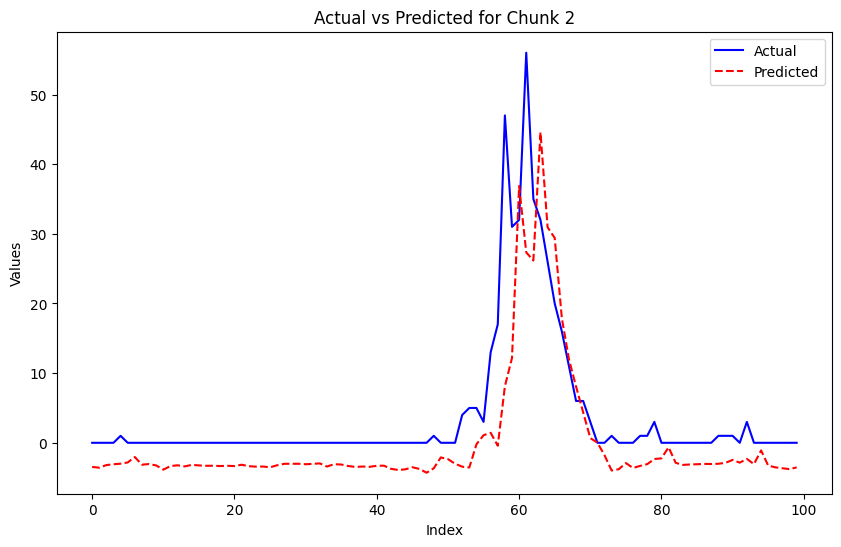

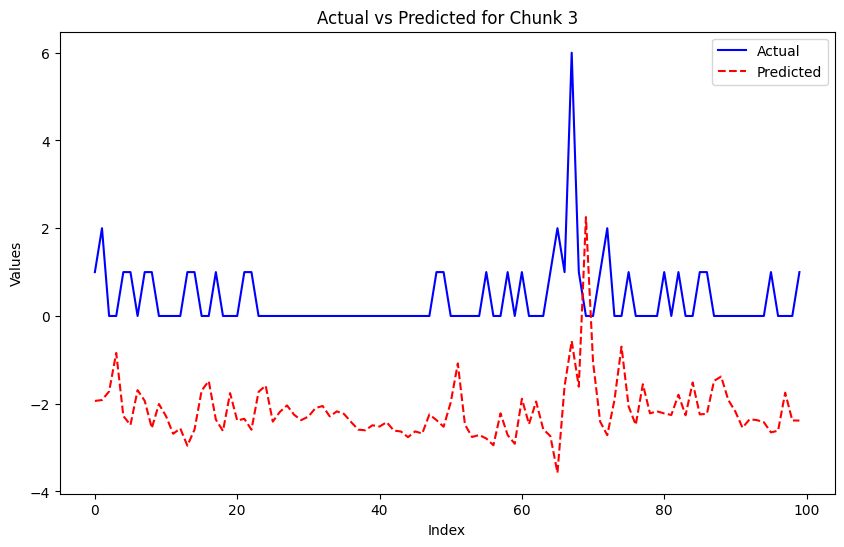

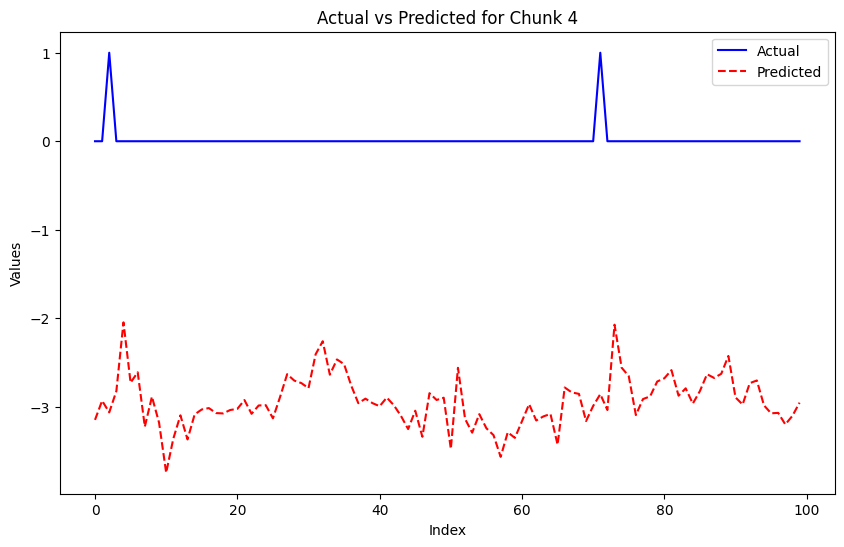

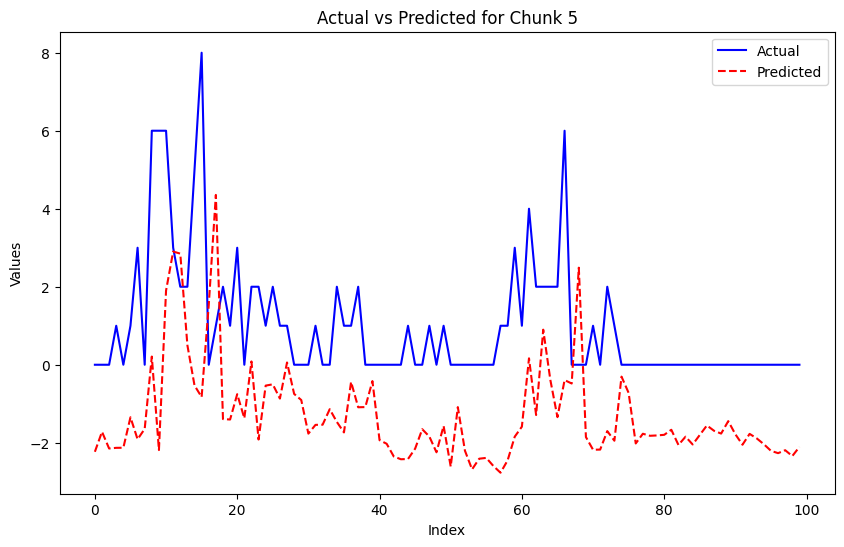

...

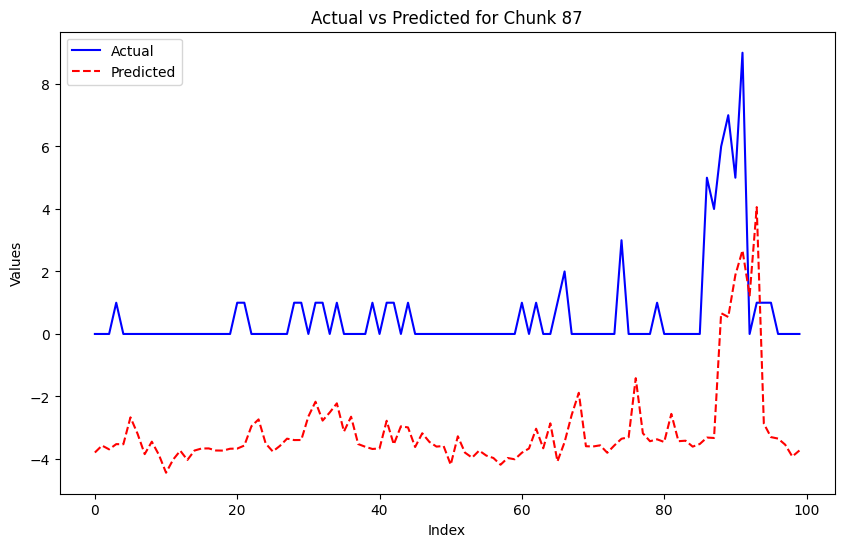

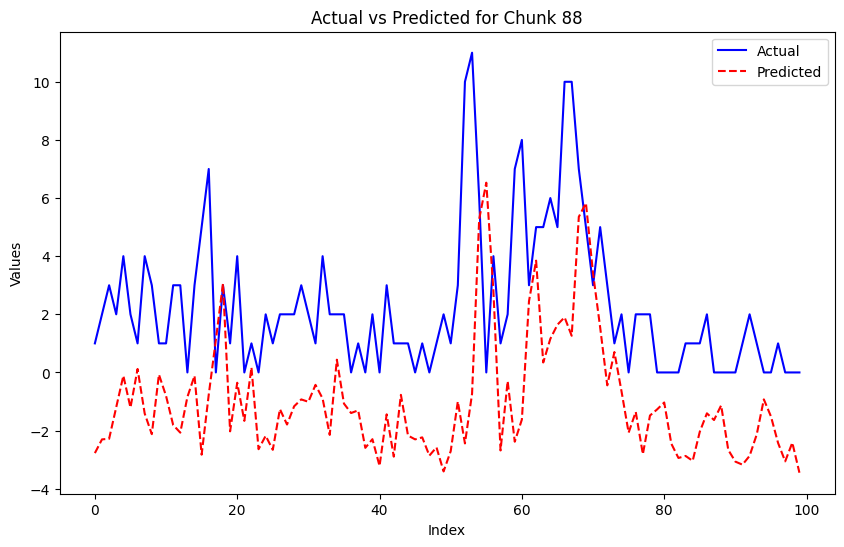

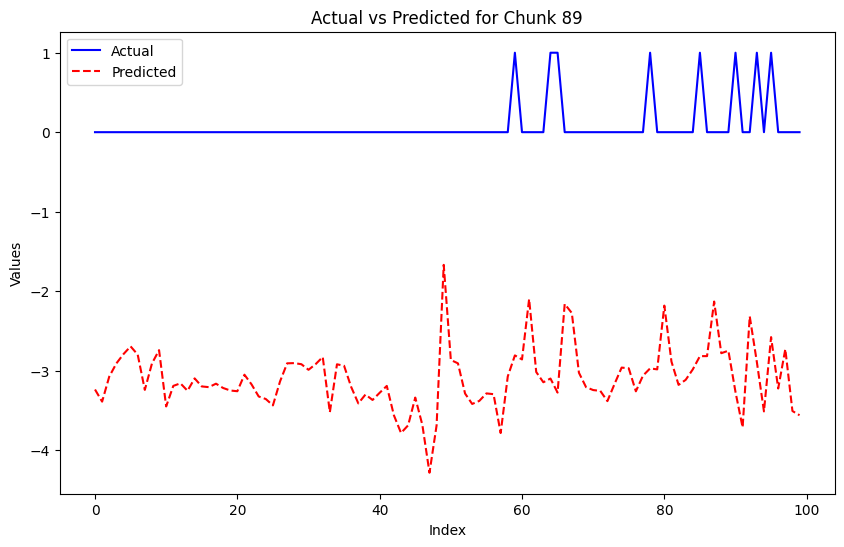

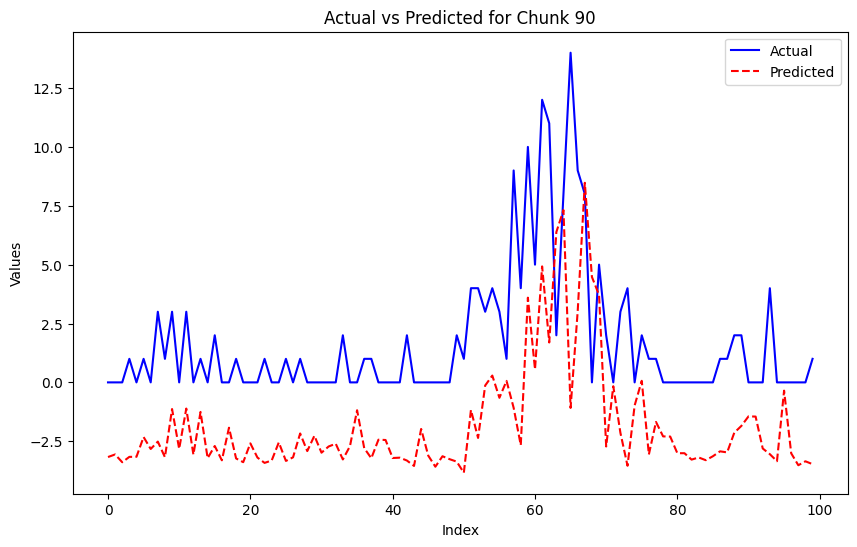

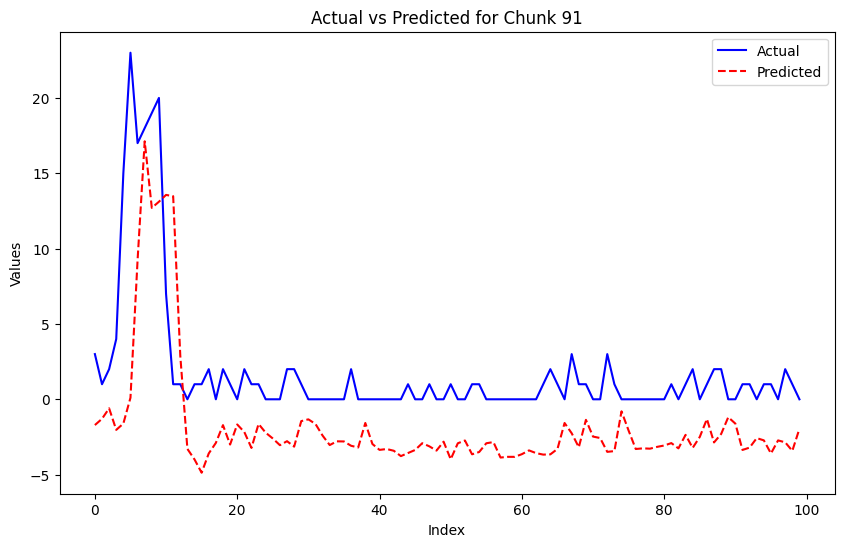

In [105]:
# Make predictions on the test data
predictions = model.predict([X_test_lstm, X_test_geocode])

# Rescale actual values back to the original scale
y_test_rescaled = target_scaler.inverse_transform(y_test.reshape(-1, 1))

# Rescale the predicted values back to the original scale
test_predictions_rescaled = target_scaler.inverse_transform(predictions)

import matplotlib.pyplot as plt

# Number of cases per plot (as you specified: 100)
chunk_size = 100
num_chunks = len(test_predictions_rescaled) // chunk_size

# Loop through each chunk and plot the actual vs predicted values
for i in range(num_chunks):
    # Get the start and end indices for the current chunk
    start_idx = i * chunk_size
    end_idx = (i + 1) * chunk_size
    
    # Get the actual and predicted values for the current chunk
    actual_chunk = y_test_rescaled[start_idx:end_idx]
    predicted_chunk = test_predictions_rescaled[start_idx:end_idx]
    
    # Plot the actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(actual_chunk, label='Actual', color='blue')
    plt.plot(predicted_chunk, label='Predicted', color='red', linestyle='--')
    plt.title(f'Actual vs Predicted for Chunk {i+1}')
    plt.xlabel('Index')
    plt.ylabel('Values')
    plt.legend()
    plt.show()


In [93]:
# for i in range(20):
#     print(f"y_train[{i}] =", y_train[i])



In [ ]:
from tensorflow.keras.layers import LSTM, Dense, Embedding, Flatten, Input

from tensorflow.keras.layers import Embedding

geocode_input = Input(shape=(1,))
geo_embedding = Embedding(input_dim=91, output_dim=8)(geocode_input)
geo_embedding = Flatten()(geo_embedding)


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Embedding, Input, Flatten
from tensorflow.keras.optimizers import Adam

# Define model
model = Sequential([
    Input(shape=(seq_length, len(selected_columns) - 1)),  # Excluding geocode column
    LSTM(128, return_sequences=True),
    Dropout(0.3),
    LSTM(64, return_sequences=False),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(1)  # Predict dengue cases
])

# Compile model with MAE
model.compile(optimizer=Adam(learning_rate=0.001), loss='mae', metrics=['mae'])

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test))

# Evaluate
test_loss, test_mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Save the model
model.save("lstm_dengue_prediction_model.h5")

# Predict on test data
predictions = model.predict(X_test)


IndexError: tuple index out of range

In [79]:
# Build the LSTM model
model = Sequential([
    LSTM(64, return_sequences=True, input_shape=(seq_length, len(selected_columns))),
    Dropout(0.2),
    LSTM(32, return_sequences=False),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Train the model


history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model
test_loss, test_mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Save the model
model.save("lstm_dengue_prediction_model.h5")

# Predict on test data
predictions = model.predict(X_test)


Epoch 1/50


c:\Program Files\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1309/1309 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - loss: 0.0031 - mae: 0.0203 - val_loss: 1.7051e-06 - val_mae: 9.3830e-04
Epoch 2/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 2.7700e-04 - mae: 0.0024 - val_loss: 6.5225e-06 - val_mae: 0.0024
Epoch 3/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 2.2270e-04 - mae: 0.0021 - val_loss: 2.9544e-06 - val_mae: 0.0015
Epoch 4/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 2.5638e-04 - mae: 0.0022 - val_loss: 1.2340e-06 - val_mae: 5.4012e-04
Epoch 5/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 2.3389e-04 - mae: 0.0021 - val_loss: 6.2718e-06 - val_mae: 0.0024
Epoch 6/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - loss: 2.3376e-04 - mae: 0.0022 - val_loss: 2.4584e-06 - val_mae: 0.0013
Epoch 7/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - loss: 1.8270e-04 - mae: 0.0020 - val_loss: 7.8289e-06 - val_mae: 0.0027
Epoch 8/50
1309/1309 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - loss: 1.9987e-04 - mae: 0.0020 - val_loss: 9.6226e-06 

Test Loss: 1.2067545185345807e-06, Test MAE: 0.0004963638493791223
285/285 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


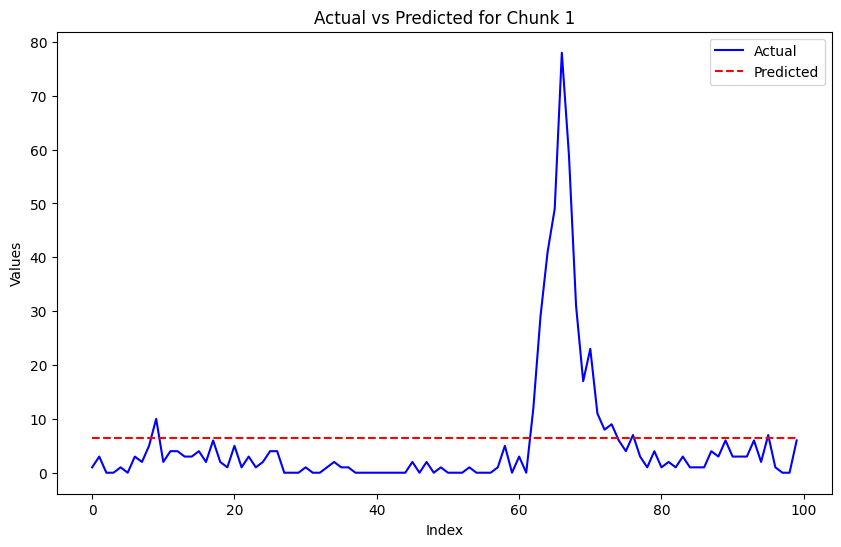

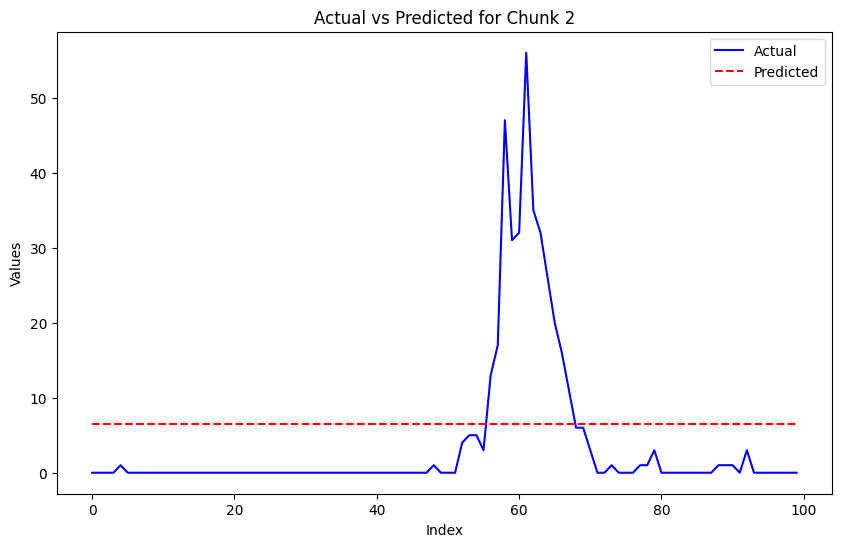

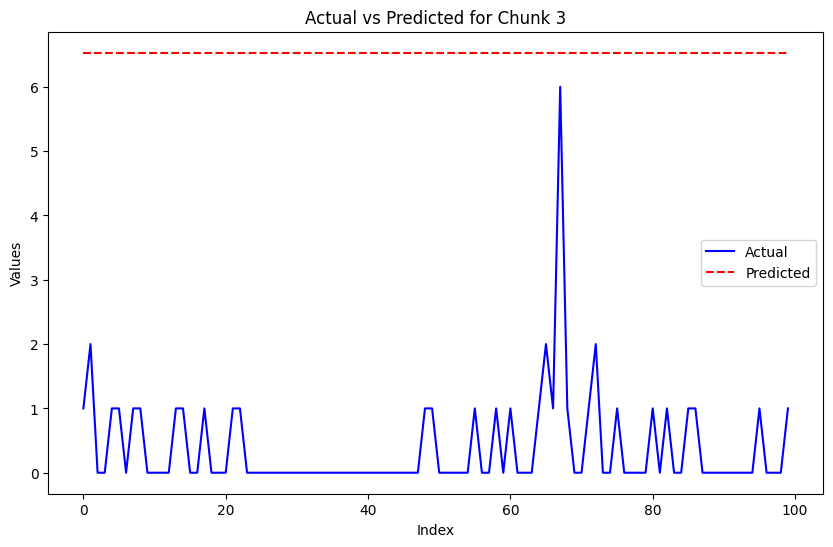

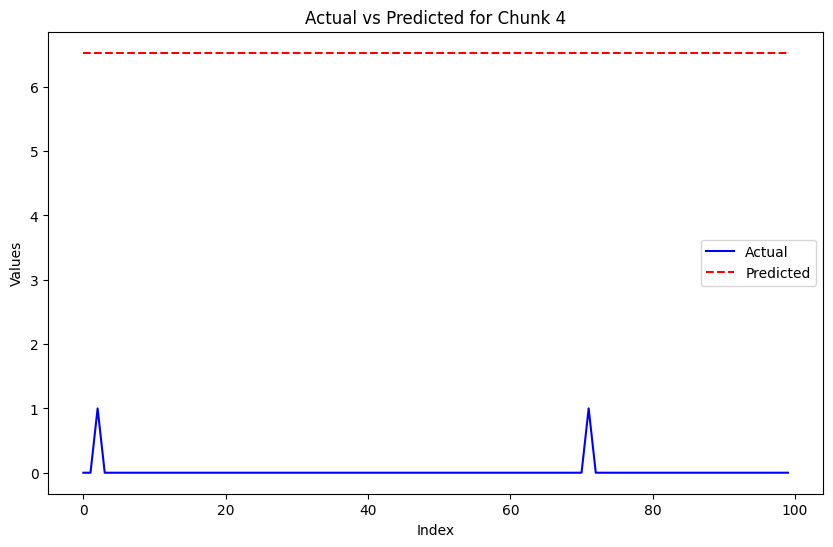

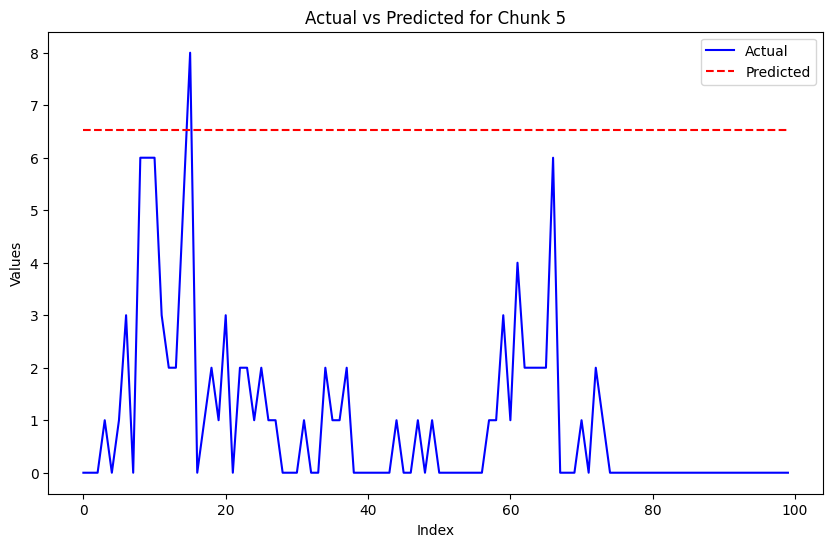

...

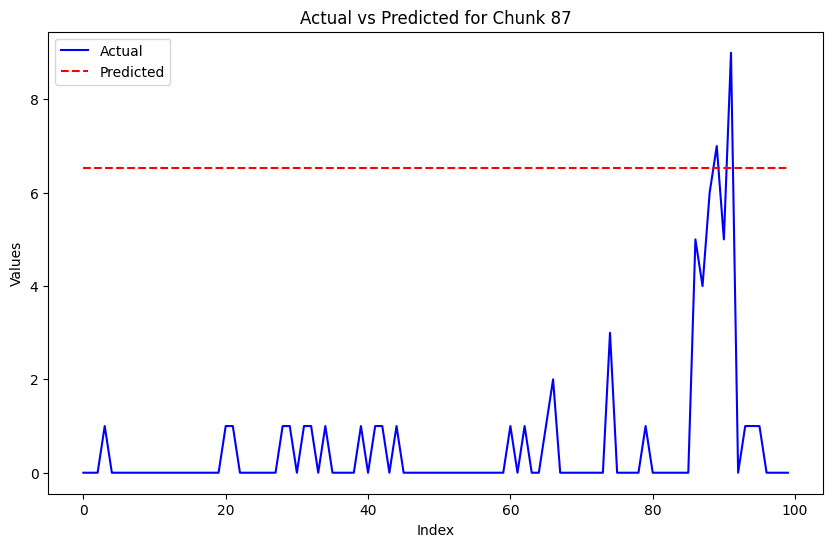

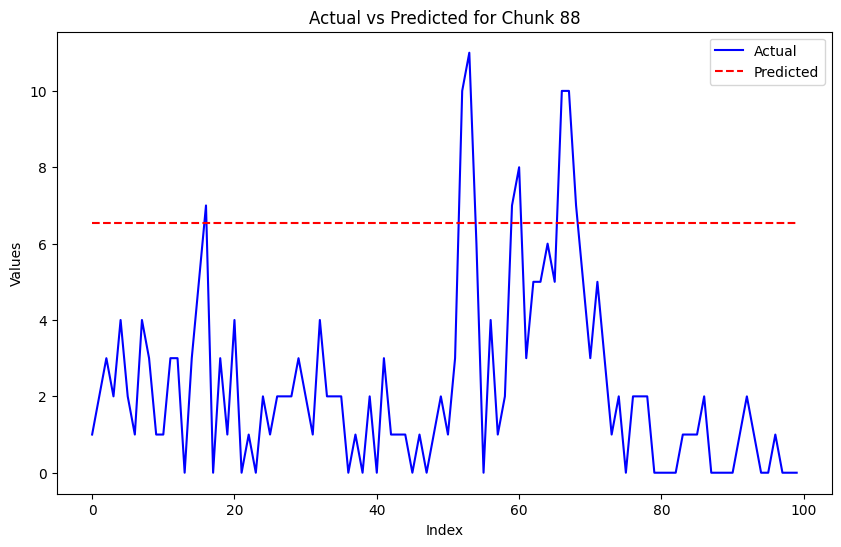

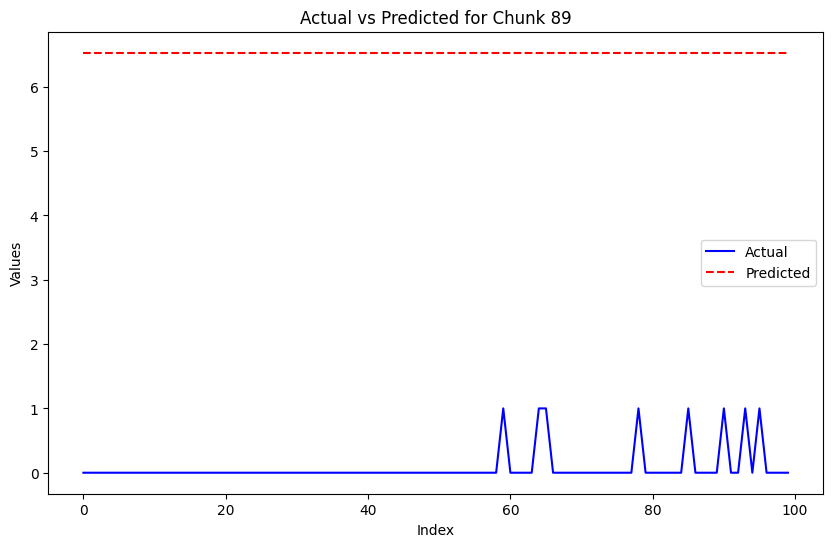

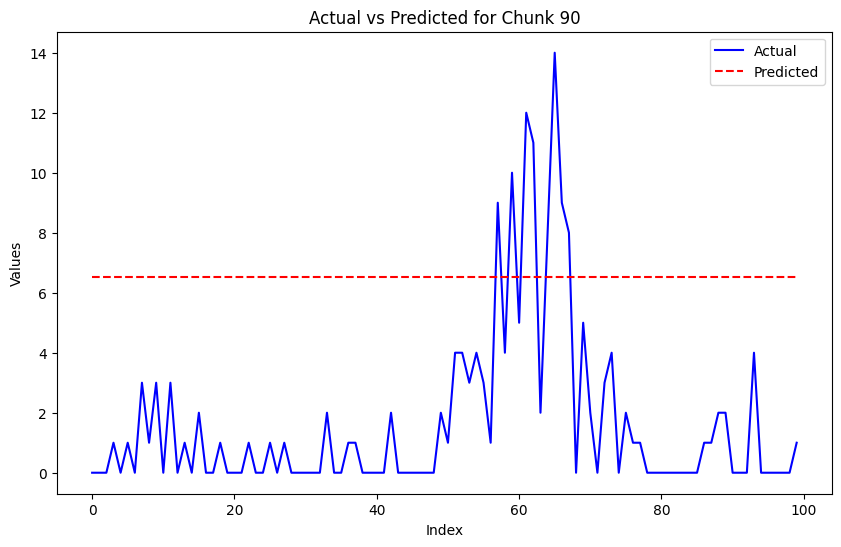

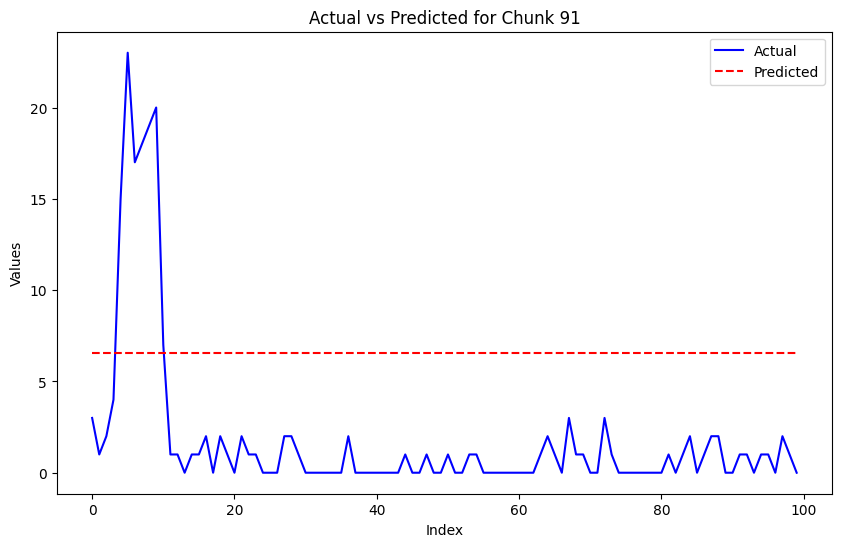

In [80]:
# Rescale actual values back to the original scale
y_test_rescaled = target_scaler.inverse_transform(y_test)
test_predictions_rescaled = target_scaler.inverse_transform(predictions)

# Number of cases per plot (as you specified: 104)
chunk_size = 100
num_chunks = len(test_predictions_rescaled) // chunk_size

# Loop through each chunk and plot the actual vs predicted values
for i in range(num_chunks):
    # Get the start and end indices for the current chunk
    start_idx = i * chunk_size
    end_idx = (i + 1) * chunk_size
    
    # Get the actual and predicted values for the current chunk
    actual_chunk = y_test_rescaled[start_idx:end_idx]
    predicted_chunk = test_predictions_rescaled[start_idx:end_idx]
    
    # Plot the actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(actual_chunk, label='Actual', color='blue')
    plt.plot(predicted_chunk, label='Predicted', color='red', linestyle='--')
    plt.title(f'Actual vs Predicted for Chunk {i+1}')
    plt.xlabel('Index')
    plt.ylabel('Values')
    plt.legend()
    plt.show()

[[ 1.9210736 ]
 [ 2.2818687 ]
 [ 2.0929918 ]
 [ 2.405981  ]
 [ 1.7579134 ]
 [ 1.495389  ]
 [ 0.9202949 ]
 [ 0.5071076 ]
 [ 1.7698216 ]
 [ 2.8026602 ]
 [ 3.5919766 ]
 [ 2.2570937 ]
 [ 1.5365833 ]
 [ 3.896519  ]
 [ 5.9246387 ]
 [ 6.251721  ]
 [ 2.8459184 ]
 [ 0.36306792]
 [ 0.2022842 ]
 [ 0.88235897]
 [ 3.583179  ]
 [ 4.6365604 ]
 [ 3.2780457 ]
 [ 1.064065  ]
 [-0.07733197]
 [ 0.05680934]
 [ 0.29958892]
 [ 0.39120215]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.40258574]
 [ 0.47553864]
 [ 0.59616935]
 [ 0.8672739 ]
 [ 0.9941885 ]
 [ 0.66956353]
 [ 0.3794612 ]
 [ 0.31245115]
 [ 0.45395392]
 [ 1.358639  ]
 [ 1.7050569 ]
 [ 1.1361698 ]
 [ 1.0452238 ]
 [ 1.6010045 ]
 [ 4.589519  ]
 [ 8.94958   ]
 [12.798069  ]
 [22.802038  ]
 [34.412518  ]
 [41.91423

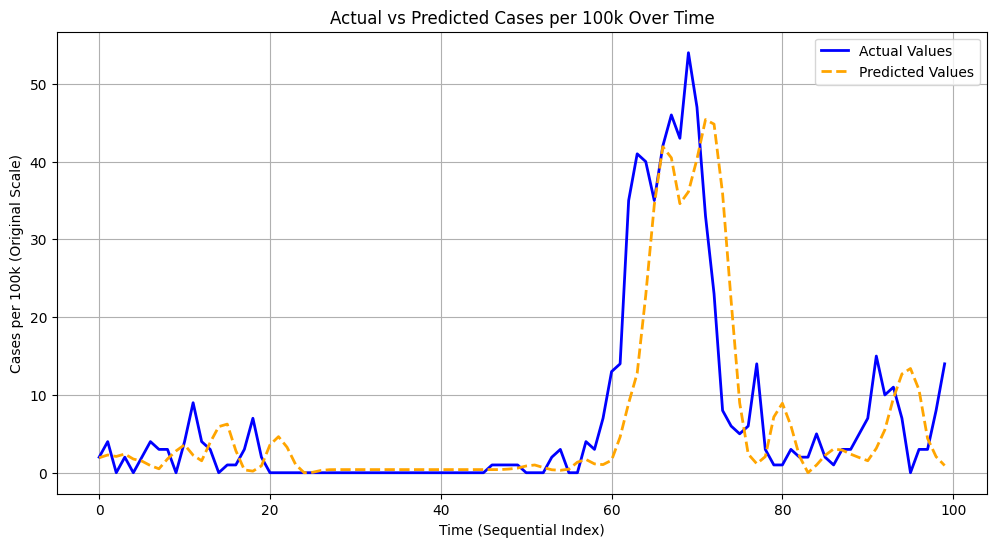

In [43]:
predictions_original_scale = target_scaler.inverse_transform(predictions)
print(predictions_original_scale)

actual_values_original_scale = target_scaler.inverse_transform(y_test)
# Create a sequential index for the x-axis (as a proxy for time)
time_index = np.arange(len(actual_values_original_scale))

# Flatten actual and predicted values for plotting
actual_values_original_scale = actual_values_original_scale.flatten()
predictions_original_scale = predictions_original_scale.flatten()
predictions_original_scale[predictions_original_scale < 0] = 0

# shapes
print("Actual Values Shape:", actual_values_original_scale.shape)
print("Predicted Values Shape:", predictions_original_scale.shape)

# Plot Actual vs Predicted
plt.figure(figsize=(12, 6))
plt.plot(time_index, actual_values_original_scale, label="Actual Values", color='blue', linewidth=2)
plt.plot(time_index, predictions_original_scale, label="Predicted Values", color='orange', linewidth=2, linestyle='--')
plt.xlabel("Time (Sequential Index)")
plt.ylabel("Cases per 100k (Original Scale)")
plt.title("Actual vs Predicted Cases per 100k Over Time")
plt.legend()
plt.grid()
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Rescale actual values back to the original scale
y_test_rescaled = target_scaler.inverse_transform(y_test)
test_predictions_rescaled = target_scaler.inverse_transform(test_predictions)

# Number of cases per plot (as you specified: 104)
chunk_size = 104
num_chunks = len(test_predictions_rescaled) // chunk_size

# Loop through each chunk and plot the actual vs predicted values
for i in range(num_chunks):
    # Get the start and end indices for the current chunk
    start_idx = i * chunk_size
    end_idx = (i + 1) * chunk_size
    
    # Get the actual and predicted values for the current chunk
    actual_chunk = y_test_rescaled[start_idx:end_idx]
    predicted_chunk = test_predictions_rescaled[start_idx:end_idx]
    
    # Plot the actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(actual_chunk, label='Actual', color='blue')
    plt.plot(predicted_chunk, label='Predicted', color='red', linestyle='--')
    plt.title(f'Actual vs Predicted for Chunk {i+1}')
    plt.xlabel('Index')
    plt.ylabel('Values')
    plt.legend()
    plt.show()

In [ ]:
data.isnull().sum()

In [ ]:
data

In [ ]:
# drops = [
#         'geocode',          # Redundant with city
#         'date_ordinal',     # Already encoded in cyclical features
#         'year',             # Remove if your data is from similar years
#         'month',            # Already encoded in month_sin/cos
#         'cases_per_100k',   # Redundant with cases and population
#         'vim',              # Monthly vegetation index already captured in vim_monthly
#         'nearby_cases_weighted'  # Could leak future information
#     ]
# data = data.drop(columns=drops)


In [ ]:


# Verify the scaling

In [ ]:
X_train

In [ ]:
y_test

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_train_reshaped
X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Build the model
input_shape = (1, X_train.shape[1])  # (timesteps, features)
model = Sequential([
    LSTM(128, input_shape=input_shape, return_sequences=True),
    Dropout(0.3),
    LSTM(64),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='linear')
])

model.compile(
    optimizer='adam',
    loss='mse',
    metrics=['mae']
)

# Set up callbacks
callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=15,
        restore_best_weights=True,
        verbose=1
    ),
    ModelCheckpoint(
        'best_dengue_model.keras',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]

# Train the model
history = model.fit(
    X_train_reshaped, 
    y_train,
    epochs=100,
    batch_size=32,
    validation_split=0.2,
    callbacks=callbacks,
    verbose=1
)

# Evaluate the model
test_loss, test_mae = model.evaluate(X_test_reshaped, y_test)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# Make predictions
train_predictions = model.predict(X_train_reshaped)
test_predictions = model.predict(X_test_reshaped)

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.title('Model MAE')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.legend()

plt.tight_layout()
plt.show()

# Print model summary
model.summary()

# Calculate and print additional metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# For test set
test_mae = mean_absolute_error(y_test, test_predictions)
test_rmse = np.sqrt(mean_squared_error(y_test, test_predictions))
test_r2 = r2_score(y_test, test_predictions)

print("\nTest Set Metrics:")
print(f"MAE: {test_mae:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"R²: {test_r2:.4f}")




In [ ]:
test_predictions

In [ ]:
import matplotlib.pyplot as plt

# Rescale actual values back to the original scale
y_test_rescaled = target_scaler.inverse_transform(y_test)
test_predictions_rescaled = target_scaler.inverse_transform(test_predictions)

# Number of cases per plot (as you specified: 104)
chunk_size = 104
num_chunks = len(test_predictions_rescaled) // chunk_size

# Loop through each chunk and plot the actual vs predicted values
for i in range(num_chunks):
    # Get the start and end indices for the current chunk
    start_idx = i * chunk_size
    end_idx = (i + 1) * chunk_size
    
    # Get the actual and predicted values for the current chunk
    actual_chunk = y_test_rescaled[start_idx:end_idx]
    predicted_chunk = test_predictions_rescaled[start_idx:end_idx]
    
    # Plot the actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(actual_chunk, label='Actual', color='blue')
    plt.plot(predicted_chunk, label='Predicted', color='red', linestyle='--')
    plt.title(f'Actual vs Predicted for Chunk {i+1}')
    plt.xlabel('Index')
    plt.ylabel('Values')
    plt.legend()
    plt.show()

In [ ]:
# Function to create overlapping sequences
def create_sequences(data, target, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length].values)  # Select seq_length rows as input
        y.append(target.iloc[i + seq_length])  # Select the next row as the target
    return np.array(X), np.array(y)

# Define sequence length
seq_length = 4

# Group data by city
city_groups_xtrain = X_train.groupby('city')
city_groups_xtest = X_test.groupby('city')

city_groups_ytrain = y_train.groupby('city')
city_groups_ytest = y_test.groupby('city')

# Initialize dictionaries to store the processed data for each city
X_train_citywise_seq = {}
y_train_citywise_seq = {}
X_test_citywise_seq = {}
y_test_citywise_seq = {}

# Process training data city-wise
for city, X_train_city in city_groups_xtrain:
    y_train_city = city_groups_ytrain.get_group(city)  # Get the corresponding target group
    # Reset index to ensure continuous indexing
    y_train_city = y_train_city.reset_index(drop=True)
    X_seq, y_seq = create_sequences(X_train_city[feature_cols], y_train_city['cases'], seq_length)  # Use 'cases' as target
    X_train_citywise_seq[city] = X_seq
    y_train_citywise_seq[city] = y_seq
    print(f"Processed X_train and y_train for city: {city}, X_seq shape: {X_seq.shape}, y_seq shape: {y_seq.shape}")

# Process testing data city-wise
for city, X_test_city in city_groups_xtest:
    y_test_city = city_groups_ytest.get_group(city)  # Get the corresponding target group
    # Reset index to ensure continuous indexing
    y_test_city = y_test_city.reset_index(drop=True)
    X_seq, y_seq = create_sequences(X_test_city[feature_cols], y_test_city['cases'], seq_length)  # Use 'cases' as target
    X_test_citywise_seq[city] = X_seq
    y_test_citywise_seq[city] = y_seq
    print(f"Processed X_test and y_test for city: {city}, X_seq shape: {X_seq.shape}, y_seq shape: {y_seq.shape}")


In [ ]:
# Define sequence length for LSTM
seq_length = 4

# Function to build and compile the model
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(64, return_sequences=True, input_shape=input_shape),
        Dropout(0.2),
        LSTM(32, return_sequences=False),
        Dropout(0.2),
        Dense(16, activation='relu'),
        Dense(1)  # Predicting a single value (cases)
    ])
    model.compile(optimizer='rmsprop', loss='mean_squared_error', metrics=['mae'])
    return model

# Loop through each city dataset
city_models = {}
city_histories = {}
city_predictions = {}

for city in X_train_citywise_seq.keys():
    print(f"Processing city: {city}")

    # Get city-specific data
    X_train_city = X_train_citywise_seq[city]
    y_train_city = y_train_citywise_seq[city]
    X_test_city = X_test_citywise_seq[city]
    y_test_city = y_test_citywise_seq[city]

    # Ensure input shape matches the LSTM model
    input_shape = (seq_length, X_train_city.shape[2])

    # Build the model
    model = build_lstm_model(input_shape)

    # Train the model
    history = model.fit(
        X_train_city, y_train_city,
        epochs=50,
        batch_size=32,
        validation_data=(X_test_city, y_test_city),
        verbose=1
    )

    # Evaluate the model
    test_loss, test_mae = model.evaluate(X_test_city, y_test_city)
    print(f"City: {city}, Test Loss: {test_loss}, Test MAE: {test_mae}")

    # Save the model for this city
    model.save(f"lstm_dengue_prediction_model_{city}.h5")

    # Predict on test data
    predictions = model.predict(X_test_city)

    # Store results
    city_models[city] = model
    city_histories[city] = history
    city_predictions[city] = predictions

    print(f"Completed processing for city: {city}\n")

In [ ]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

# Function to plot Actual vs Predicted and calculate RMSE
def plot_actual_vs_predicted(city, y_test_city, predictions_city, target_scaler):
    # Ensure to only pass the target variable (numeric values) to the scaler
    y_test_values = y_test_city['cases'].values  # Assuming 'cases' is the target column
    predictions_original_scale = target_scaler.inverse_transform(predictions_city)
    actual_values_original_scale = target_scaler.inverse_transform(y_test_values.reshape(-1, 1))  # Reshape for scaling

    # Ensure both predictions and actual values have the same length
    min_length = min(len(actual_values_original_scale), len(predictions_original_scale))

    actual_values_original_scale = actual_values_original_scale[:min_length].flatten()
    predictions_original_scale = predictions_original_scale[:min_length].flatten()
    predictions_original_scale[predictions_original_scale < 0] = 0

    time_index = np.arange(min_length)

    # Print shapes
    print(f"City: {city} - Actual Values Shape:", actual_values_original_scale.shape)
    print(f"City: {city} - Predicted Values Shape:", predictions_original_scale.shape)

    # Plot Actual vs Predicted
    plt.figure(figsize=(12, 6))
    plt.plot(time_index, actual_values_original_scale, label="Actual Values", color='blue', linewidth=2)
    plt.plot(time_index, predictions_original_scale, label="Predicted Values", color='orange', linewidth=2, linestyle='--')
    plt.xlabel("Time (Sequential Index)")
    plt.ylabel("Cases per 100k (Original Scale)")
    plt.title(f"{city} - Actual vs Predicted Cases per 100k Over Time")
    plt.legend()
    plt.grid()
    plt.show()

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(actual_values_original_scale, predictions_original_scale))
    print(f"City: {city} - RMSE: {rmse}")

# Loop through each city's predictions and plot
for city in city_predictions.keys():
    predictions_city = city_predictions[city]
    y_test_city = city_groups_ytest.get_group(city)

    # Call the function to plot and calculate RMSE
    plot_actual_vs_predicted(city, y_test_city, predictions_city, target_scaler)